C:/Users/Eric/Pictures/Fotos/kleiner/1628755325046.png


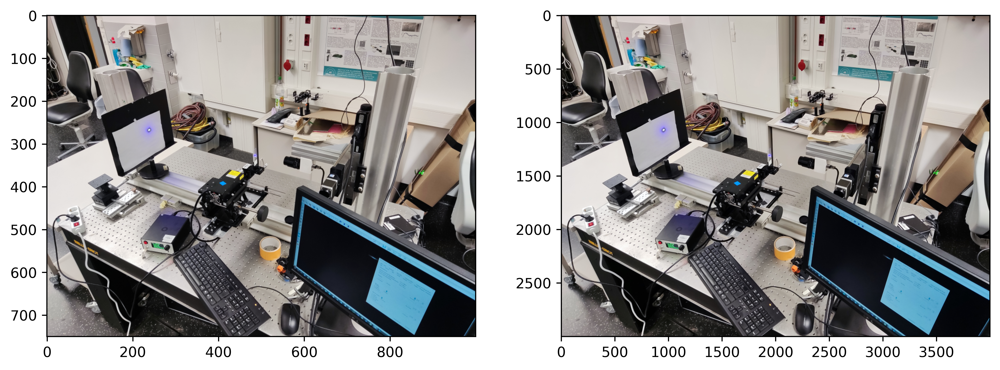

In [6]:
import cv2
import matplotlib.pyplot as plt

import tkinter as tk
from tkinter import filedialog

###If Model works depends on OpenCV version. Current settings are working for 4.6.0.

modelPath = "./Models/FSRCNN_x4.pb"
"""
EDSR_x2.pb
EDSR_x3.pb
EDSR_x4.pb
ESPCN_x2.pb
ESPCN_x3.pb
ESPCN_x4.pb
files.txt
FSRCNN-small_x2.pb
FSRCNN-small_x3.pb
FSRCNN-small_x4.pb
FSRCNN_x2.pb
FSRCNN_x3.pb
FSRCNN_x4.pb
LapSRN_x2.pb
LapSRN_x4.pb
LapSRN_x8.pb
"""
modelType = "fsrcnn"
"""
esdr
espcn
fsrcnn
lapsrn
"""
modelScale = 4
"""
Model_x[value].pb
"""


root = tk.Tk()
root.withdraw()
root.call('wm', 'attributes', '.', '-topmost', True)
files = filedialog.askopenfilename(multiple=True,
    title='Choose a Image file',
    filetypes=[('image files', '.png;.jpg'),
               ('image files!', '*.png;*.jpg'),
               ('all files', '.*')])  
%gui tk
var = root.tk.splitlist(files)
filePaths = []
for f in var:
    filePaths.append(f)

for file in filePaths: 
    print(file) 
    img = cv2.imread(file);
    
    #initialize model
    sr = cv2.dnn_superres.DnnSuperResImpl_create()
    sr.readModel(modelPath)
    sr.setModel(modelType,modelScale)
    result = sr.upsample(img)

    plt.figure(figsize=(12,8),dpi=600)
    plt.subplot(1,2,1)
    # Original image
    plt.imshow(img[:,:,::-1])
    plt.subplot(1,2,2)
    # SR upscaled
    plt.imshow(result[:,:,::-1])
    cv2.imwrite(file + "_"+modelType+"_"  +str(modelScale)+".jpg", result)